Обучение предобученной YOLOv8m на датасете с CCTV кадрами для детекции и трекинга посетителей на камерах видео наблюдения. Сравнение по mean IoU с дефолт YOLOv8m

Для дообучения используется [этот датасет](https://universe.roboflow.com/projecthuman/human-tracking-krcgm/dataset/3) с кадрами объектов 18 типов в качестве, близком к CCTV.

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
! pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.7/778.7 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 44.9 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
model = YOLO('yolov8m.pt')

results = model.train(data='/content/drive/MyDrive/yolo_detection_dataset/data.yaml', epochs=50, imgsz=640, model='yolov8m.pt')

100%|██████████| 49.7M/49.7M [00:00<00:00, 221MB/s]


Ultralytics YOLOv8.2.23 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/yolo_detection_dataset/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_label

100%|██████████| 755k/755k [00:00<00:00, 102MB/s]


Overriding model.yaml nc=80 with nc=33

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytic

100%|██████████| 6.23M/6.23M [00:00<00:00, 409MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/yolo_detection_dataset/train/labels.cache... 2340 images, 5 backgrounds, 0 corrupt: 100%|██████████| 2340/2340 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/yolo_detection_dataset/valid/labels.cache... 541 images, 0 backgrounds, 0 corrupt: 100%|██████████| 541/541 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00027, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.23G      1.262      1.876      1.362         15        640: 100%|██████████| 147/147 [02:30<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [02:48<00:00,  9.89s/it]

                   all        541       1612      0.893       0.58      0.628      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       7.2G      1.187      1.126      1.307         24        640: 100%|██████████| 147/147 [01:25<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.75it/s]

                   all        541       1612      0.833      0.574      0.586      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.21G      1.143      1.032      1.296         24        640: 100%|██████████| 147/147 [01:25<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.81it/s]

                   all        541       1612      0.833      0.541      0.604      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      7.18G      1.169      1.025      1.311         14        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.86it/s]

                   all        541       1612      0.822      0.592      0.617      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.23G      1.169     0.9603      1.306         11        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.43it/s]

                   all        541       1612       0.88      0.632      0.654      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.18G      1.141     0.9558      1.291         11        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:10<00:00,  1.66it/s]

                   all        541       1612      0.867      0.615       0.65      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.33G      1.093     0.8986      1.264         14        640: 100%|██████████| 147/147 [01:25<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  1.93it/s]

                   all        541       1612      0.797      0.649      0.659       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.12G      1.098     0.8642      1.258         37        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.73it/s]

                   all        541       1612      0.863      0.656      0.675      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.15G      1.074     0.8269      1.263         32        640: 100%|██████████| 147/147 [01:40<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.75it/s]

                   all        541       1612      0.732      0.704      0.675      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.13G      1.062     0.8327      1.256         11        640: 100%|██████████| 147/147 [01:30<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.76it/s]

                   all        541       1612      0.754      0.677       0.67      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.26G      1.043      0.802      1.236          8        640: 100%|██████████| 147/147 [01:25<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:14<00:00,  1.19it/s]

                   all        541       1612      0.773      0.667      0.685      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.17G      1.034     0.7583      1.223         44        640: 100%|██████████| 147/147 [01:33<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  1.90it/s]

                   all        541       1612      0.891      0.662      0.702      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.23G      1.011     0.7637      1.218          5        640: 100%|██████████| 147/147 [01:27<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.76it/s]

                   all        541       1612      0.694      0.663      0.664      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.09G     0.9893     0.7521      1.215         27        640: 100%|██████████| 147/147 [01:32<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  1.89it/s]

                   all        541       1612      0.696      0.715      0.705      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.24G     0.9807      0.732      1.201         22        640: 100%|██████████| 147/147 [01:31<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.74it/s]

                   all        541       1612      0.725      0.672      0.685       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.33G     0.9848     0.7061      1.191         16        640: 100%|██████████| 147/147 [01:28<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.85it/s]

                   all        541       1612      0.718      0.707      0.703      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.21G     0.9525     0.6967      1.192         18        640: 100%|██████████| 147/147 [01:26<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  1.92it/s]

                   all        541       1612      0.692      0.697      0.684      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.15G     0.9456     0.6699      1.184         16        640: 100%|██████████| 147/147 [01:30<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.70it/s]

                   all        541       1612      0.785      0.708      0.724      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.19G     0.9456     0.6575      1.174         15        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  1.95it/s]

                   all        541       1612      0.746      0.688      0.716      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.18G     0.9172     0.6375      1.154         11        640: 100%|██████████| 147/147 [01:25<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.76it/s]

                   all        541       1612      0.696      0.759      0.731      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.21G     0.8969     0.6299      1.157         17        640: 100%|██████████| 147/147 [01:25<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  1.95it/s]

                   all        541       1612      0.791      0.723      0.701      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.16G     0.9132     0.6188       1.16         81        640: 100%|██████████| 147/147 [01:25<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.53it/s]

                   all        541       1612      0.775      0.711      0.741      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.22G     0.8859      0.607       1.15         10        640: 100%|██████████| 147/147 [01:25<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.42it/s]

                   all        541       1612      0.747      0.749      0.754      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.21G     0.8777     0.5948      1.145         13        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.46it/s]

                   all        541       1612       0.74      0.726      0.724      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.28G     0.8963     0.6138      1.158         18        640: 100%|██████████| 147/147 [01:24<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.78it/s]

                   all        541       1612      0.836      0.722      0.752      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       7.1G      0.863     0.5802      1.132         16        640: 100%|██████████| 147/147 [01:26<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.83it/s]

                   all        541       1612      0.732      0.734      0.729      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      7.22G     0.8507     0.5657      1.127         10        640: 100%|██████████| 147/147 [01:26<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.53it/s]

                   all        541       1612      0.714      0.762      0.752       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      7.18G     0.8488     0.5661      1.134         17        640: 100%|██████████| 147/147 [01:24<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.42it/s]

                   all        541       1612      0.722      0.801      0.736      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.21G     0.8345     0.5597      1.121         23        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.53it/s]

                   all        541       1612      0.747      0.728       0.73      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.25G     0.8206     0.5449      1.107          9        640: 100%|██████████| 147/147 [01:24<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.83it/s]

                   all        541       1612      0.793      0.729      0.738      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.15G     0.8148      0.527      1.099         17        640: 100%|██████████| 147/147 [01:26<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.86it/s]

                   all        541       1612      0.694      0.766       0.73      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       7.2G     0.7966     0.5201      1.096         13        640: 100%|██████████| 147/147 [01:25<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.53it/s]

                   all        541       1612      0.784      0.731      0.738       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.21G     0.8073     0.5316       1.11          5        640: 100%|██████████| 147/147 [01:24<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.44it/s]

                   all        541       1612      0.773      0.721      0.743      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.03G     0.7942      0.503      1.092         23        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.48it/s]

                   all        541       1612      0.793      0.726      0.738      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.22G     0.7976     0.5127      1.097          9        640: 100%|██████████| 147/147 [01:23<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.87it/s]

                   all        541       1612       0.78      0.744       0.76      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      7.18G      0.772     0.4946      1.074         20        640: 100%|██████████| 147/147 [01:23<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:10<00:00,  1.60it/s]

                   all        541       1612      0.784      0.735      0.749      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.26G     0.7679     0.4854      1.081         51        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.82it/s]

                   all        541       1612      0.813      0.738      0.744      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.09G     0.7535     0.4718      1.079         20        640: 100%|██████████| 147/147 [01:24<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  1.93it/s]

                   all        541       1612      0.759       0.74      0.745      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      7.34G     0.7438     0.4705      1.075         12        640: 100%|██████████| 147/147 [01:24<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:10<00:00,  1.67it/s]

                   all        541       1612       0.74      0.751      0.749       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.18G      0.742     0.4663      1.077          9        640: 100%|██████████| 147/147 [01:24<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.43it/s]

                   all        541       1612       0.76      0.779      0.761      0.663


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.14G     0.6221      0.362      1.001         13        640: 100%|██████████| 147/147 [01:24<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.50it/s]

                   all        541       1612      0.719      0.747      0.733       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.15G     0.6091     0.3486     0.9876          6        640: 100%|██████████| 147/147 [01:21<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:10<00:00,  1.56it/s]

                   all        541       1612      0.723      0.767      0.752      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.14G     0.6013     0.3364     0.9806          9        640: 100%|██████████| 147/147 [01:22<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  2.00it/s]

                   all        541       1612      0.714      0.767      0.747      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      7.11G     0.5851     0.3272     0.9711          7        640: 100%|██████████| 147/147 [01:23<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.54it/s]

                   all        541       1612      0.736      0.752      0.745      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.14G     0.5789     0.3226       0.97         13        640: 100%|██████████| 147/147 [01:22<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:10<00:00,  1.61it/s]

                   all        541       1612      0.744      0.758      0.745       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       7.2G     0.5729     0.3245     0.9662          7        640: 100%|██████████| 147/147 [01:22<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  1.95it/s]

                   all        541       1612      0.755      0.751      0.745      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      7.35G      0.562     0.3134     0.9588          9        640: 100%|██████████| 147/147 [01:24<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:12<00:00,  1.33it/s]

                   all        541       1612      0.744      0.758      0.749      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.13G     0.5564     0.3061     0.9507          6        640: 100%|██████████| 147/147 [01:23<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.50it/s]

                   all        541       1612      0.767      0.747      0.759       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.14G     0.5421      0.299     0.9484          5        640: 100%|██████████| 147/147 [01:22<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:08<00:00,  1.94it/s]

                   all        541       1612      0.756       0.75      0.757      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.03G     0.5337     0.2975     0.9451          6        640: 100%|██████████| 147/147 [01:23<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:10<00:00,  1.56it/s]

                   all        541       1612        0.8      0.743      0.761       0.67



50 epochs completed in 1.429 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.1MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.1MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.23 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25858867 parameters, 0 gradients, 78.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:16<00:00,  1.05it/s]


                   all        541       1612      0.757       0.75      0.757      0.671
               Bicycle        541         75      0.992          1      0.995      0.988
                  Bike        541         15       0.96          1      0.995      0.995
                   Car        541         15          1          1      0.995      0.995
            Pedestrian        541        668      0.919      0.967      0.982      0.806
             Signboard        541         15       0.96          1      0.995      0.995
               Stopper        541         45      0.987          1      0.995      0.983
              forklift        541         12      0.774       0.75      0.745      0.619
                  high        541         14      0.511      0.357       0.48      0.211
                   low        541         21       0.29      0.238      0.189     0.0867
                medium        541         16      0.238      0.125      0.162     0.0902
                peopl

Сохраняем архив с результатами и визуализируем их

In [ ]:
import zipfile
path = '/content/runs'
zip_path = '/content/drive/My Drive/train_yolo_results.zip'
with zipfile.ZipFile(zip_path, 'w') as zipf:
    for root, dirs, files in os.walk(path):
        for file in files:
            zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), path))

In [3]:
!unzip '/content/drive/MyDrive/train_yolo_results.zip' -d '/content/drive/MyDrive/train_yolo_results'

Archive:  /content/drive/MyDrive/train_yolo_results.zip
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/labels_correlogram.jpg  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/results.png  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/F1_curve.png  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/confusion_matrix_normalized.png  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/train_batch0.jpg  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/val_batch1_labels.jpg  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/args.yaml  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/P_curve.png  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/labels.jpg  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/confusion_matrix.png  
 extracting: /content/drive/MyDrive/train_yolo_results/detect/train/eve

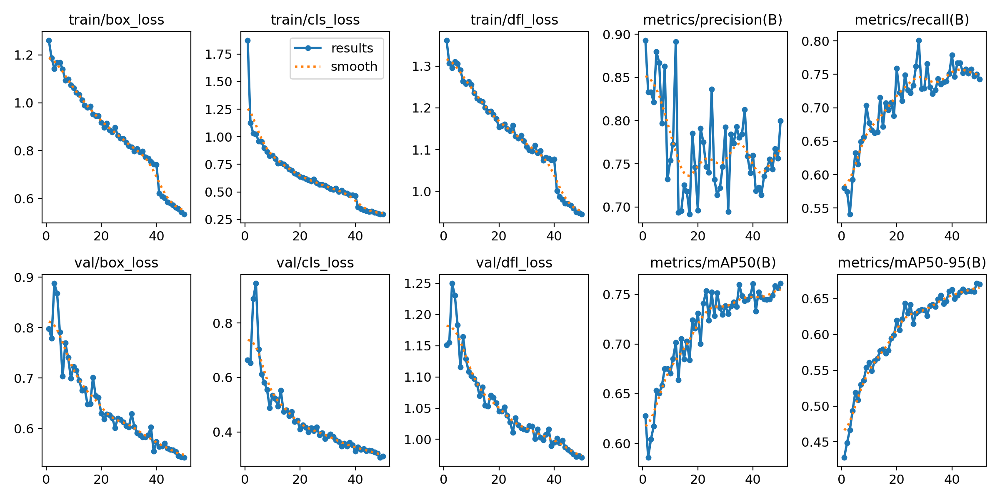

In [5]:
Image('/content/drive/MyDrive/train_yolo_results/detect/train/results.png')

labels_correlogram.jpg


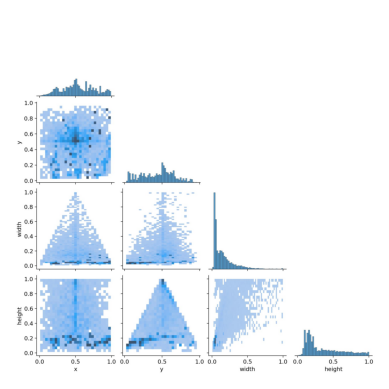

results.png


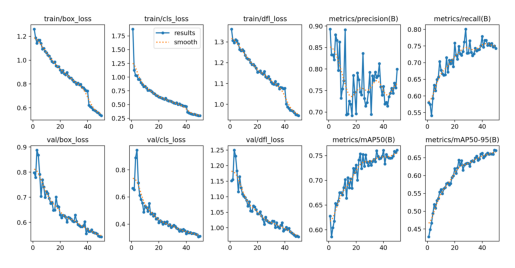

F1_curve.png


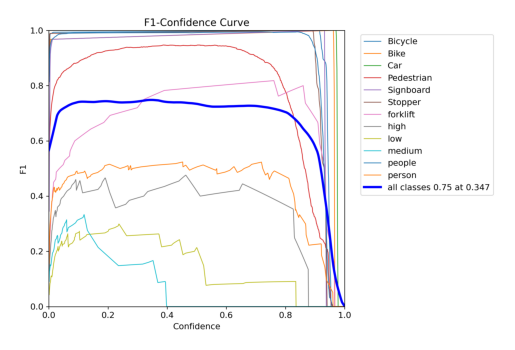

confusion_matrix_normalized.png


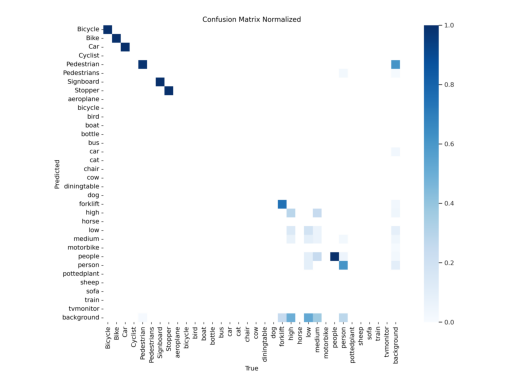

train_batch0.jpg


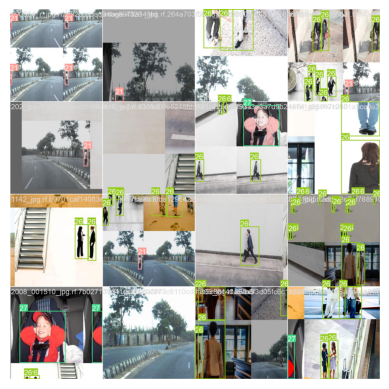

val_batch1_labels.jpg


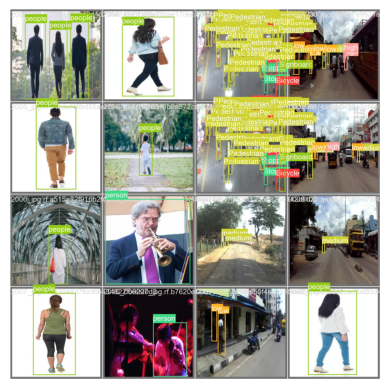

P_curve.png


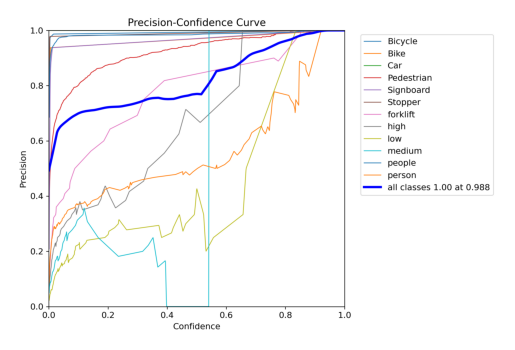

labels.jpg


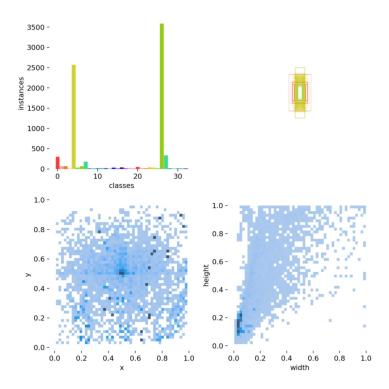

confusion_matrix.png


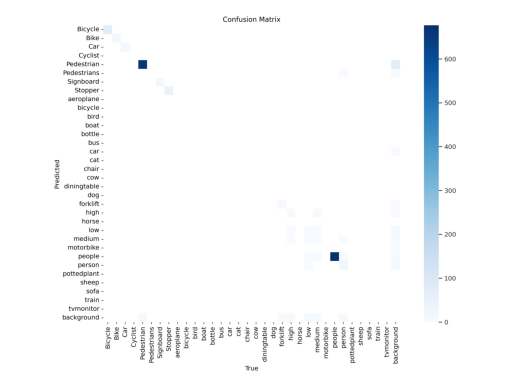

train_batch1.jpg


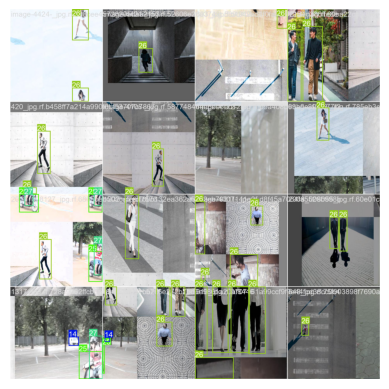

val_batch0_pred.jpg


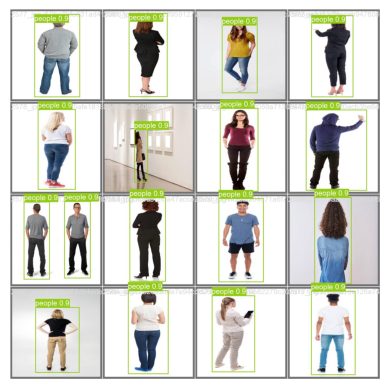

train_batch5880.jpg


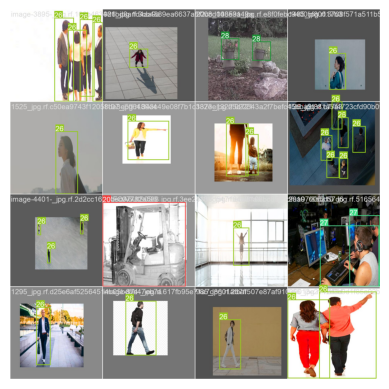

val_batch1_pred.jpg


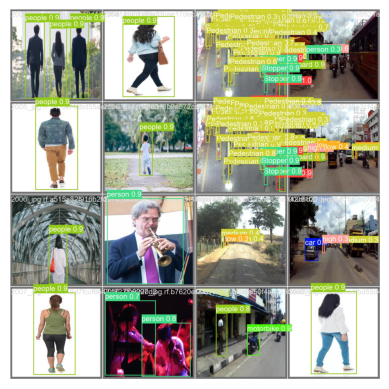

val_batch0_labels.jpg


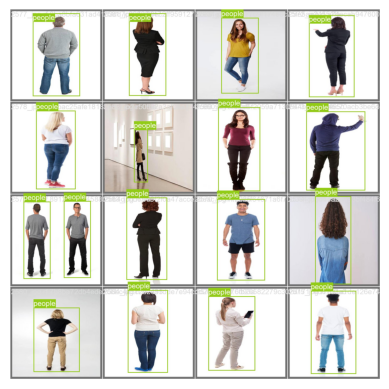

train_batch5882.jpg


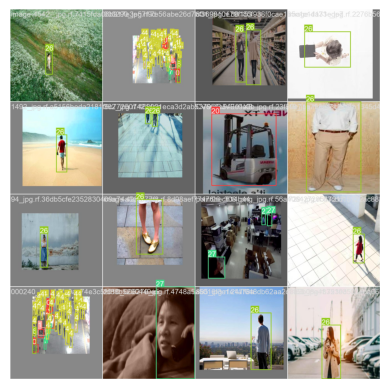

train_batch2.jpg


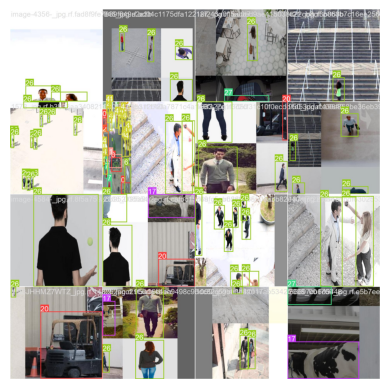

PR_curve.png


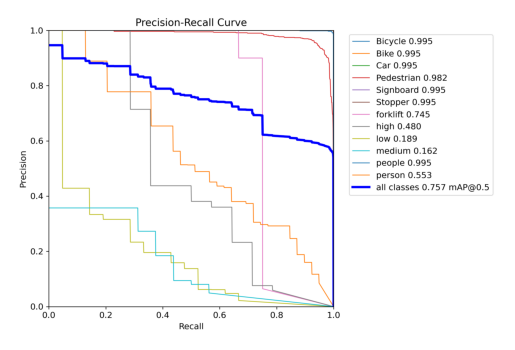

R_curve.png


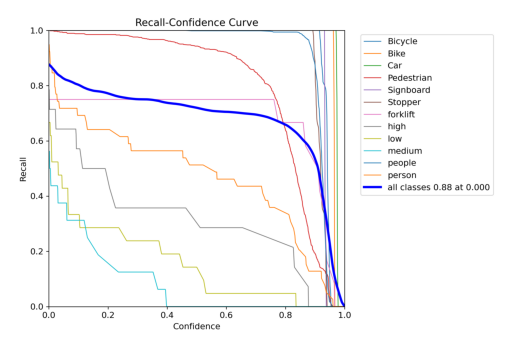

val_batch2_pred.jpg


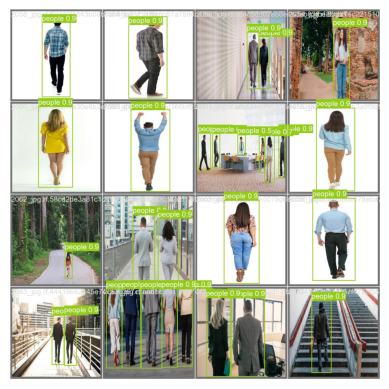

val_batch2_labels.jpg


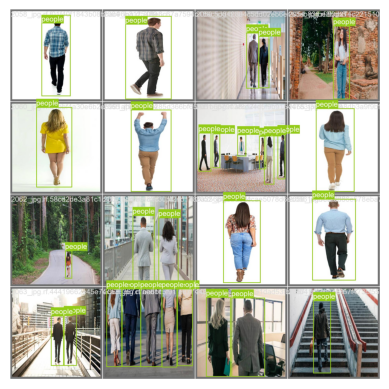

train_batch5881.jpg


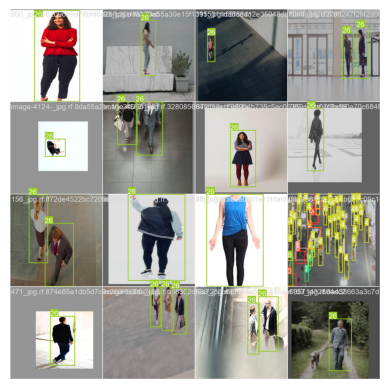

In [8]:
import os
from IPython.display import Image
from PIL import Image
import matplotlib.pyplot as plt

def show_results(directory):
    for root, dirs, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            ext = os.path.splitext(file)[-1].lower()
            if ext in ['.png', '.jpg', '.jpeg']:
                print(file)
                img = Image.open(file_path)
                plt.imshow(img)
                plt.axis('off')
                plt.show()

directory_to_show = '/content/drive/MyDrive/train_yolo_results/detect/train'

show_results(directory_to_show)

Функции для инференса моделей детекции и трекинга человека

In [44]:
import cv2
from ultralytics import YOLO


def draw_bounding_boxes_without_id(model, frame, results):
    results = model.track(frame, iou=0.4, conf=0.5, persist=True, imgsz=608, verbose=False, tracker="bytetrack.yaml", classes=0)
    boxes = results[0].boxes.xyxy.cpu().numpy().astype(int)
    ids = results[0].boxes.cls.cpu().numpy().astype(int)
    for box, id in zip(boxes, ids):
        if id != 0:
            color = (0,255,255)
            cv2.rectangle(frame, (box[0], box[1]), (box[2], box[3],), color, 2)
            cv2.putText(
                frame,
                f"{model.model.names[ids]}",
                (box[0], box[1]),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                (50, 255, 50),
                2,
            )
    return frame


def process_video_with_tracking(model, input_video_path, show_video=False, save_video=True, output_video_path="/content/drive/MyDrive/yolo_detection_dataset/output_video.mp4"):
    cap = cv2.VideoCapture(input_video_path)

    if not cap.isOpened():
        raise Exception("Error: Could not open video file.")
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    if save_video:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        results = model.track(frame, iou=0.4, conf=0.5, imgsz=640, verbose=False, tracker="bytetrack.yaml")
        # results_detect = model_detect.predict(frame, iou=0.4, conf=0.5,  imgsz=608, verbose=False)

        if results[0].boxes.id != None:
            boxes = results[0].boxes.xyxy.cpu().numpy().astype(int)
            ids = results[0].boxes.id.cpu().numpy().astype(int)

            for box, id in zip(boxes, ids):
                color = (0,255, 255)

                cv2.rectangle(frame, (box[0], box[1]), (box[2], box[3],), color, 2)
                cv2.putText(
                    frame,
                    f"Id {id}",
                    (box[0], box[1]),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.70,
                    (0, 255, 255),
                    2,
                )


        if save_video:
            out.write(frame)

        if show_video:
            frame = cv2.resize(frame, (0, 0), fx=0.75, fy=0.75)
            cv2.imshow("frame", frame)

        if cv2.waitKey(1) & 0xFF == ord("q"):
            break

    cap.release()
    if save_video:
        out.release()

    cv2.destroyAllWindows()
    return results

In [62]:
import cv2
import matplotlib.pyplot as plt

def show_result(results, image, type):
  if results[0].boxes.id is not None:
    boxes = results[0].boxes.xyxy.cpu().numpy().astype(int)
    ids = results[0].boxes.id.cpu().numpy().astype(int)
    for box, id in zip(boxes, ids):
      color = (0, 255, 255)
      cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), color, 2)
      cv2.putText(
          image,
          f"Id {id}",
          (box[0], box[1]),
          cv2.FONT_HERSHEY_SIMPLEX,
          0.70,
          (0, 255, 255),
          2,
      )
      plt.imshow(image)
      plt.axis('off')
      plt.title(type)
      plt.show()
  else:
    print(f"{type} model doesnt see")

def detect_person_comparison(model_default, model_trained, image_path):
  image = cv2.imread(image_path)
  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  results_default = model_default.track(image_rgb, iou=0.4, conf=0.25, imgsz=640, verbose=False, tracker="bytetrack.yaml")
  results_trained = model_trained.track(image_rgb, iou=0.4, conf=0.25, imgsz=640, verbose=False, tracker="bytetrack.yaml")
  show_result(results_default, image_rgb, 'default')
  show_result(results_trained, image_rgb, 'trained')


In [97]:
model_default = YOLO('yolov8m.pt')
model_default.fuse()

YOLOv8m summary (fused): 218 layers, 25886080 parameters, 0 gradients, 78.9 GFLOPs


In [98]:
model_trained = YOLO('/content/drive/MyDrive/train_yolo_results/detect/train/weights/best.pt')
model_trained.fuse()

Model summary (fused): 218 layers, 25858867 parameters, 0 gradients, 78.8 GFLOPs


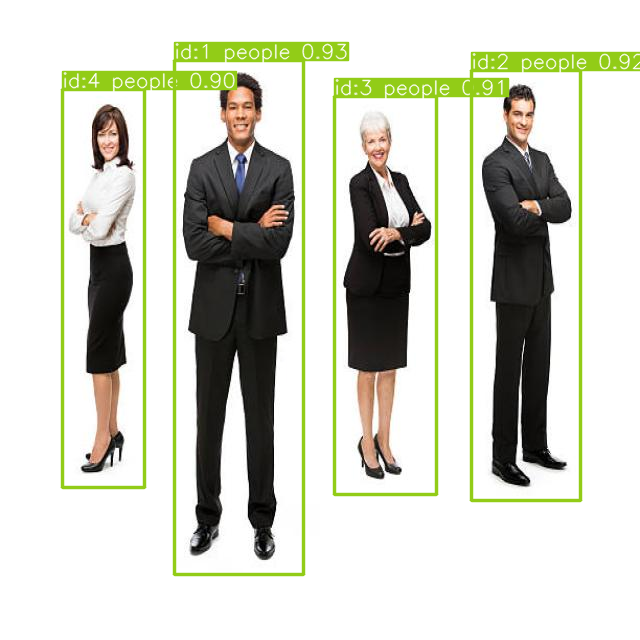

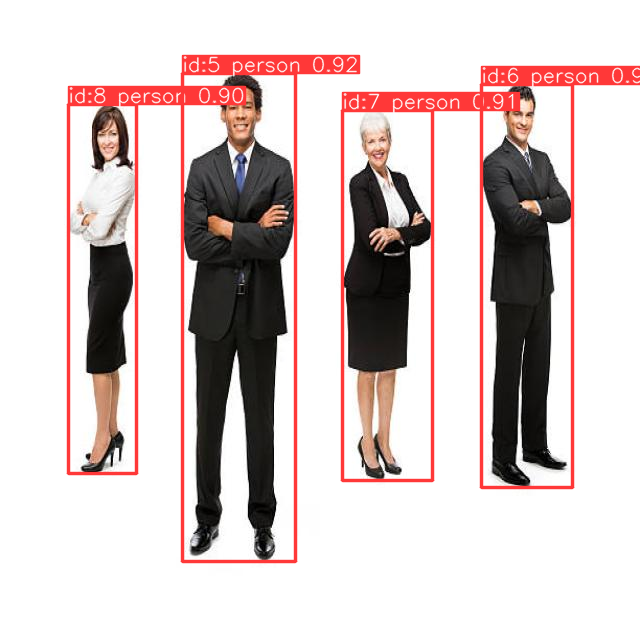

In [57]:
import cv2
from google.colab.patches import cv2_imshow

def show_with_annotation(model, image_path):
  image = cv2.imread(image_path)

  results = results = model.track(image, iou=0.4, conf=0.25, imgsz=640, verbose=False, tracker="bytetrack.yaml")

  annotated_image = results[0].plot()

  cv2_imshow(annotated_image)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

show_with_annotation(model_trained, '/content/drive/MyDrive/yolo_detection_dataset/test/images/1630_jpg.rf.b8656eb81b98c2d2626092df45829582.jpg')
show_with_annotation(model_default, '/content/drive/MyDrive/yolo_detection_dataset/test/images/1630_jpg.rf.b8656eb81b98c2d2626092df45829582.jpg')

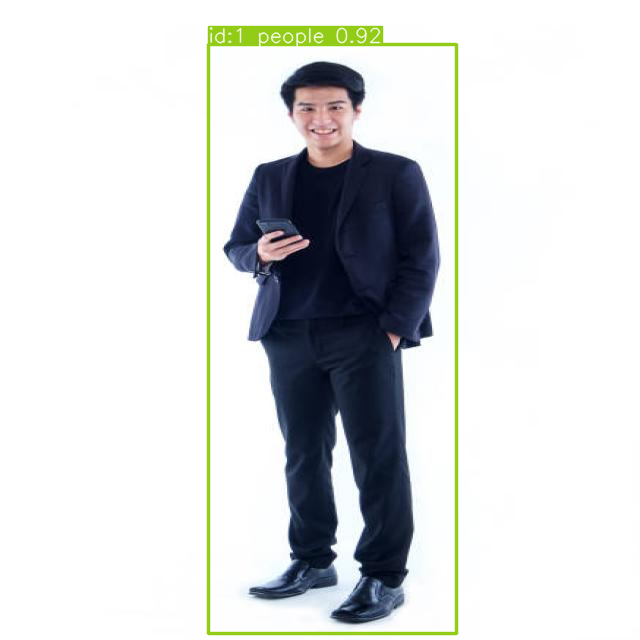

In [59]:
show_with_annotation(model_trained, '/content/drive/MyDrive/yolo_detection_dataset/test/images/1664_jpg.rf.0a2cc199a9d9f33e80525e8da5877206.jpg')

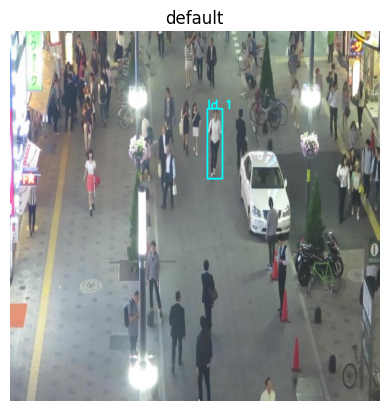

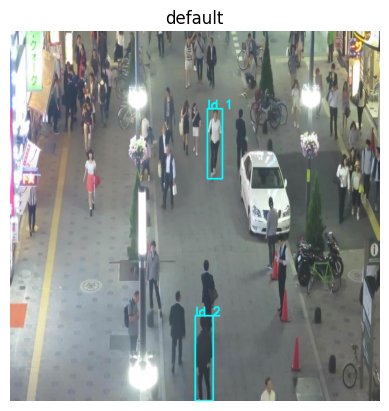

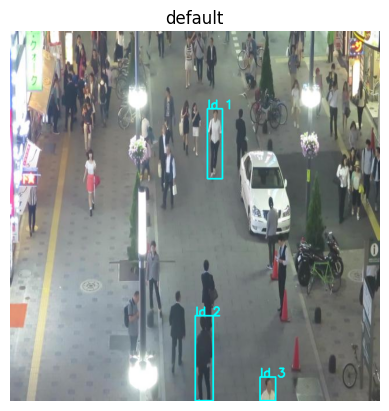

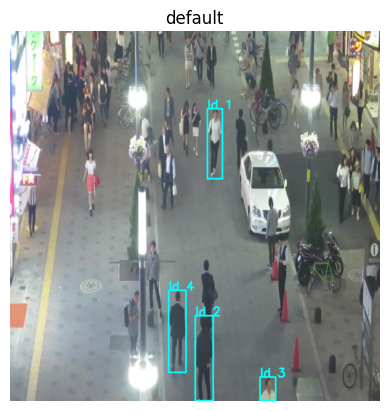

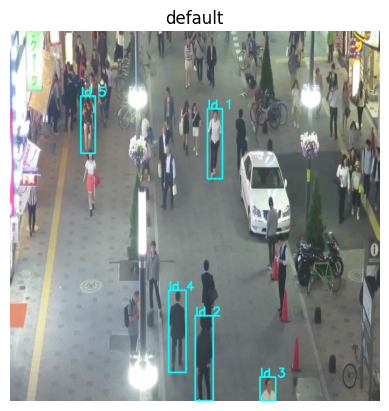

...

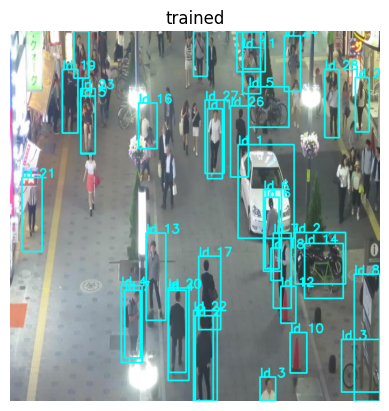

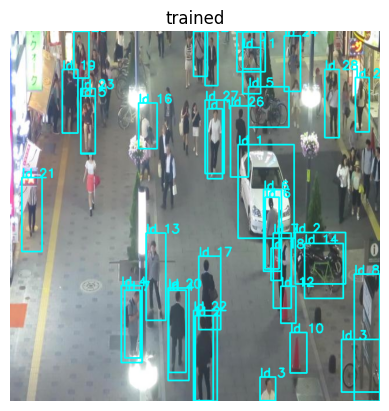

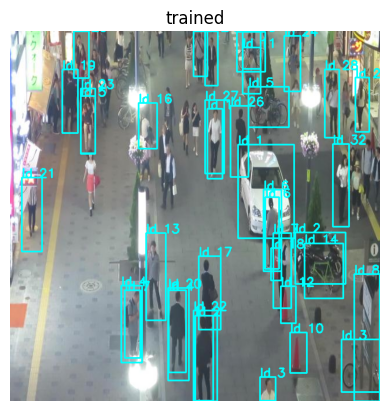

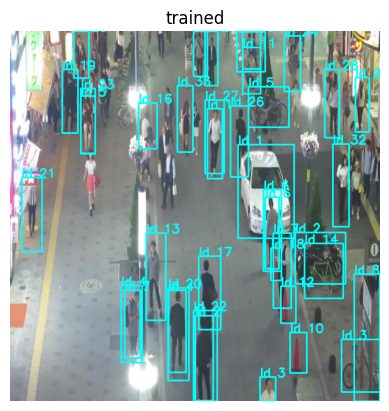

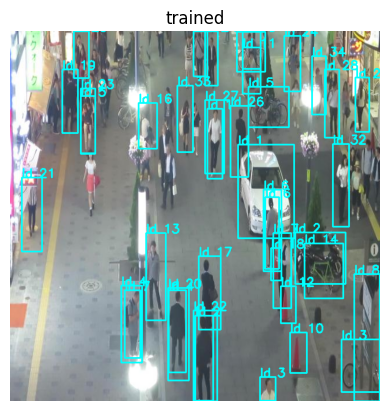

In [63]:
image_path = '/content/drive/MyDrive/yolo_detection_dataset/test/images/000123_jpg.rf.54072eceb59c8bdeb79eed283aec37b5.jpg'
detect_person_comparison(model_default, model_trained, image_path)

In [194]:
image_path = '/content/drive/MyDrive/yolo_detection_dataset/test/images/1621_jpg.rf.fa51180ff1ccdfecf99822f63f789d15.jpg'
detect_person_comparison(model_trained, model_trained, image_path)

default model doesnt see
trained model doesnt see


In [65]:
test_video_path = '/content/drive/MyDrive/yolo_detection_dataset/Shoplifting1.mp4'
process_video_with_tracking(model_trained, test_video_path)

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Bicycle', 1: 'Bike', 2: 'Car', 3: 'Cyclist', 4: 'Pedestrian', 5: 'Pedestrians', 6: 'Signboard', 7: 'Stopper', 8: 'aeroplane', 9: 'bicycle', 10: 'bird', 11: 'boat', 12: 'bottle', 13: 'bus', 14: 'car', 15: 'cat', 16: 'chair', 17: 'cow', 18: 'diningtable', 19: 'dog', 20: 'forklift', 21: 'high', 22: 'horse', 23: 'low', 24: 'medium', 25: 'motorbike', 26: 'people', 27: 'person', 28: 'pottedplant', 29: 'sheep', 30: 'sofa', 31: 'train', 32: 'tvmonitor'}
 obb: None
 orig_img: array([[[ 39,  32,  29],
         [ 32,  25,  22],
         [ 32,  25,  22],
         ...,
         [ 51,  64,  80],
         [ 30,  47,  63],
         [ 31,  48,  64]],
 
        [[ 38,  31,  28],
         [ 33,  26,  23],
         [ 33,  26,  23],
         ...,
         [ 58,  71,  87],
         [ 43,  60,  76],
         [ 31,  48,  64]],
 
        [[ 38,  29,  26],
    

Замерим и сравним IoU на тестовой выборке у моделей.

In [12]:
import torch
from torchvision import ops
def Get_IoU(true_box_coords, pred_box_coords):
  x_min = torch.max(true_box_coords[0][0], pred_box_coords[0][0])
  y_min = torch.max(true_box_coords[0][1], pred_box_coords[0][1])
  x_max = torch.min(true_box_coords[0][2], pred_box_coords[0][2])
  y_max = torch.min(true_box_coords[0][3], pred_box_coords[0][3])

  height = torch.max(y_max-y_min+1, torch.tensor(0.))
  width = torch.max(x_max-x_min+1, torch.tensor(0.))

  intersection_area = height * width

  true_height = true_box_coords[0][3]- true_box_coords[0][1] + 1
  true_width = true_box_coords[0][2]- true_box_coords[0][0] + 1

  pred_height = pred_box_coords[0][3]- pred_box_coords[0][1] + 1
  pred_width = pred_box_coords[0][2]- pred_box_coords[0][0] + 1

  union_area = true_height * true_width + pred_height * pred_width - intersection_area

  IoU = intersection_area / union_area
  return IoU

In [175]:
# def compute_iou(boxA, boxB):
#     xA = max(float(boxA[0]), float(boxB[0]))
#     yA = max(float(boxA[1]), float(boxB[1]))
#     xB = min(float(boxA[2]), float(boxB[2]))
#     yB = min(float(boxA[3]), float(boxB[3]))

#     interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
#     boxAArea = (float(boxA[2]) - float(boxA[0]) + 1) * (float(boxA[3]) - float(boxA[1]) + 1)
#     boxBArea = (float(boxB[2]) - float(boxB[0]) + 1) * (float(boxB[3]) - float(boxB[1]) + 1)

#     iou = interArea / float(boxAArea + boxBArea - interArea)
#     return iou


def compute_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_xmin = max(float(x1_min), float(x2_min))
    inter_ymin = max(float(y1_min), float(y2_min))
    inter_xmax = min(float(x1_max), float(x2_max))
    inter_ymax = min(float(y1_max), float(y2_max))

    inter_width = max(inter_xmax - inter_xmin, 0)
    inter_height = max(inter_ymax - inter_ymin, 0)
    inter_area = inter_width * inter_height

    box1_area = (float(x1_max) - float(x1_min)) * (float(y1_max) - float(y1_min))
    box2_area = (float(x2_max) - float(x2_min)) * (float(y2_max) - float(y2_min))

    iou = inter_area / float(box1_area + box2_area - inter_area)

    return iou

In [191]:
import numpy as np
def Get_mean_IoU(predictions, ground_truth):
    all_IoU = []
    for img_path, preds in zip(test_images, predictions):
        # prediction = preds[0].boxes
        gt_boxes = ground_truth[img_path]
        for pred in preds[0].boxes.xyxy:
            pred_box = [pred[0].item(), pred[1].item(), pred[2].item(), pred[3].item()]
            # pred_box_absolut = convert_to_absolute_coordinates(pred_box, 640, 640)
            ious = [compute_iou(pred_box, gt_box) for gt_box in gt_boxes]
            max_iou = max(ious) if ious else 15
            # print(max_iou)
            all_IoU.append(max_iou)
    mean_iou = np.mean(all_IoU)
    return mean_iou

In [81]:
# загружаем изображения тестовой выборки

test_images = []
def recieve_test_images(test_images):
  path_dir_images = '/content/drive/MyDrive/yolo_detection_dataset/test/images'
  for root, dirs, files in os.walk(path_dir_images):
        for file in files:
            file_path = os.path.join(root, file)
            # print(file_path)
            test_images.append(file_path)
recieve_test_images(test_images)

In [82]:
len(test_images)

319

In [144]:
# получаем предсказания моделей на test_images

from tqdm import tqdm
def get_predictions(model, images):
    predictions = []
    for img in tqdm(images):
        results = model.track(img, iou=0.4, conf=0.25, imgsz=640, verbose=False)
        predictions.append(results)
    return predictions
predictions_trained = get_predictions(model_trained, test_images)
predictions_default = get_predictions(model_default, test_images)

100%|██████████| 319/319 [09:31<00:00,  1.79s/it]


In [182]:
img = test_images[117]
results = model_trained.track(img, iou=0.4, conf=0.25, imgsz=640, verbose=False)
results[0].boxes.xyxy.cpu().numpy().astype(int)

WARNING ⚠️ imgsz=[400] must be multiple of max stride 32, updating to [416]


array([[259,  41, 571, 640]])

Функции для перевода из одного YOLO-формата боксов в другой.

model_trained.track возвращает боксы в виде (x_min, y_min, x_max, y_max), а в тестовых данных боксы заданы в формате (x_center, y_center, width, height) и отнормированы по центрам.

In [183]:
def convert_to_normalized_coordinates(yolo_box, img_width, img_height):
    x_min, y_min, x_max, y_max = yolo_box
    x_center = ((x_min + x_max) / 2) / img_width
    y_center = ((y_min + y_max) / 2) / img_height
    width = (x_max - x_min) / img_width
    height = (y_max - y_min) / img_height
    return [x_center, y_center, width, height]

In [184]:
def convert_to_absolute_coordinates(yolo_box, img_width, img_height):
    x_center, y_center, width, height = yolo_box
    x_min = (x_center - width / 2) * img_width
    y_min = (y_center - height / 2) * img_height
    x_max = (x_center + width / 2) * img_width
    y_max = (y_center + height / 2) * img_height
    return [x_min, y_min, x_max, y_max]

In [156]:
predictions_default[100][0].boxes.xyxy.cpu().numpy().astype(int)
#boxes = results[0].boxes.xyxy.cpu().numpy().astype(int)

array([[221,  63, 417, 638]])

In [154]:
test_images[100]

'/content/drive/MyDrive/yolo_detection_dataset/test/images/1660_jpg.rf.56dce96995ac36ba112c24568112d245.jpg'

In [179]:
predictions_default[100][0].boxes.xyxy.cpu().numpy().astype(int)

array([[221,  63, 417, 638]])

In [180]:
predictions_default[100][0].boxes.xyxy

tensor([[221.4839,  63.9181, 417.5430, 638.4601]])

Получаем эталонные координаты боксов в формате (x_min, y_min, x_max, y_max)

In [189]:
def recieve_true_coords(images):
  true_coords = {}
  for img in images:
    img_coords = []
    label_file_path = '.'.join(img.split('.')[:-1]) +'.txt'
    label_file_path = label_file_path.replace('images', 'labels')
    with open(label_file_path, 'r') as input_file:
      lines = input_file.readlines()
    for line in lines:
      coords = line.split(' ')[1:]
      box = [float(x) for x in coords]
      coords_abs = convert_to_absolute_coordinates(box, 640, 640)
      img_coords.append(coords_abs)
    true_coords[img] = img_coords
  return true_coords
ground_truth = recieve_true_coords(test_images)

In [164]:
t = ground_truth['/content/drive/MyDrive/yolo_detection_dataset/test/images/1660_jpg.rf.56dce96995ac36ba112c24568112d245.jpg']
print(float(t[0][0])*640, float(t[0][1])*640, float(t[0][2])*640, float(t[0][3])*640)

317.0 346.0 232.0 587.5


In [190]:
ground_truth['/content/drive/MyDrive/yolo_detection_dataset/test/images/1963_jpg.rf.0ca07c7135f3febff0737be8de2c595c.jpg']

[[152.5, 17.500000000000036, 487.5, 631.5]]

Считаем среднее IoU для моделей

In [192]:
mean_iou_trained = Get_mean_IoU(predictions_trained, ground_truth)
mean_iou_default = Get_mean_IoU(predictions_default, ground_truth)

In [195]:
formatted = "{:.15f}".format(mean_iou_trained)
print(f"Mean IoU для дообученной yolov8m модели: {formatted}")
print(f"Man IoU для yolov8m модели: {mean_iou_default}")

Mean IoU для дообученной yolov8m модели: 0.890230071838809
Man IoU для yolov8m модели: 0.667068566625536


In [166]:
process_video_with_tracking(model_trained, '/content/drive/MyDrive/preprocessed_videos/Shoplifting2.mp4')

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Bicycle', 1: 'Bike', 2: 'Car', 3: 'Cyclist', 4: 'Pedestrian', 5: 'Pedestrians', 6: 'Signboard', 7: 'Stopper', 8: 'aeroplane', 9: 'bicycle', 10: 'bird', 11: 'boat', 12: 'bottle', 13: 'bus', 14: 'car', 15: 'cat', 16: 'chair', 17: 'cow', 18: 'diningtable', 19: 'dog', 20: 'forklift', 21: 'high', 22: 'horse', 23: 'low', 24: 'medium', 25: 'motorbike', 26: 'people', 27: 'person', 28: 'pottedplant', 29: 'sheep', 30: 'sofa', 31: 'train', 32: 'tvmonitor'}
 obb: None
 orig_img: array([[[132, 131, 156],
         [ 98,  97, 122],
         [ 66,  65,  90],
         ...,
         [ 62,  67,  65],
         [ 29,  34,  32],
         [ 27,  32,  30]],
 
        [[102, 101, 126],
         [ 67,  66,  91],
         [ 51,  50,  75],
         ...,
         [ 62,  67,  65],
         [ 29,  34,  32],
         [ 27,  32,  30]],
 
        [[ 69,  68,  93],
    